In [48]:
# !pip install --upgrade rioxarray
# !pip install --upgrade numpy
# !pip install --upgrade pandas
# !pip install --upgrade plotly
# !pip install --upgrade pyarrow
# !pip install --upgrade matplotlib
# !pip install --upgrade s2cloudless
# !pip install --upgrade pandas
# !pip install --upgrade black
# !pip install --upgrade pandas "dask[complete]"
# !pip install sentinelhub

In [49]:
import matplotlib.image as mpimg
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt
import numpy as np
import rioxarray
from s2cloudless import S2PixelCloudDetector, download_bands_and_valid_data_mask
from osgeo import gdal
import datetime as dt

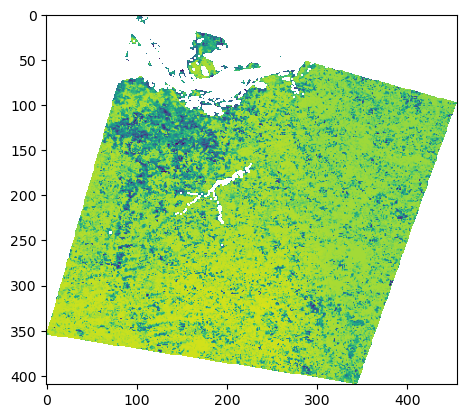

In [2]:
dataset = gdal.Open('MOD17A2H.061_Gpp_500m_doy2021001_aid0001.tif') # Abrindo a imagem com o gdal

bd1 = dataset.GetRasterBand(1).ReadAsArray() # Pegando a primeira (e única nesse caso) banda do satélite e lendo-a como um array

resultado = np.copy(bd1).astype(float) # Precisa colocar como float para evitar erros

indices_substituir = np.isin(bd1, [32761, 32762, 32763, 32764, 32765, 32766, 32767])

resultado[indices_substituir] = np.nan # Substituindo os valores acima como nan para não aparecerem no plot


plt.imshow(resultado)

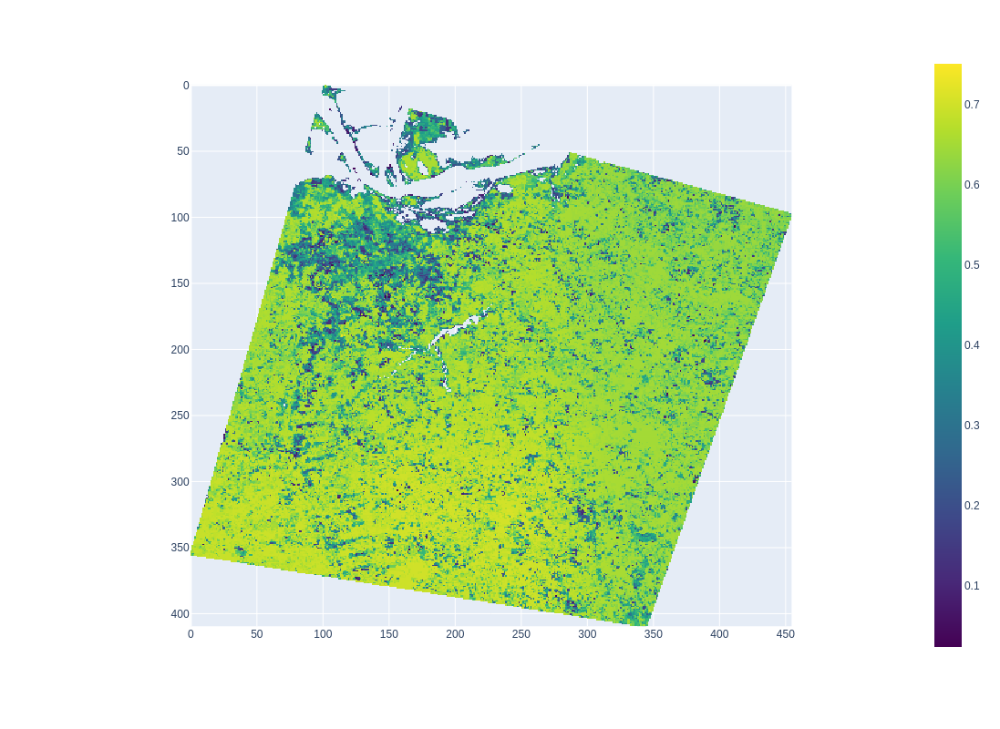

In [83]:
px.imshow(resultado / 1000 ,width=1200, height=800,color_continuous_scale='viridis') # Plotly, dividindo por 1000 devido à escala

In [11]:
import sys
print(sys.version)

3.11.5 (main, Sep 11 2023, 13:54:46) [GCC 11.2.0]


In [181]:
# Lista de strings
lista_strings = ["HLSS30.020_B01_doy2016013_aid0001_21S", "HLSS30.020_B01_doy2016043_aid0001_21S", "HLSS30.020_B02_doy2016013_aid0001_21S"]

# Função para obter a parte numérica da string
def obter_parte_numerica(file):
    splitted = file.split('doy')
    return int(splitted[1][0:7]),splitted[0][11:14]  # Supõe que o número está após o traço

# Ordena a lista com base na parte numérica de cada string
lista_ordenada = sorted(lista_strings, key=lambda x: obter_parte_numerica(x))


# Exibe a lista ordenada
print([item for item in lista_ordenada if '2016013' in item])


['HLSS30.020_B01_doy2016013_aid0001_21S', 'HLSS30.020_B02_doy2016013_aid0001_21S']


In [242]:
%%time
import os


class ImageProcessing:
    
    INVALID_VALUE = -9999
    RESCALE_FACTOR = 0.0001
    
    def __init__(self,pastas:str):
        self.bands = []
        self.mask = []
        self.pastas = pastas
        self._arquivos_na_pasta = self._pasta_arquivos(self.pastas)
        #self._folder_processing(self._arquivos_na_pasta)
        
    def _pasta_arquivos(self,pasta):
        temp = os.listdir(pasta)
        temp.remove('.ipynb_checkpoints')
        temp = sorted(temp, key=lambda x:self._date_band(x))
        return temp

    def _date_band(self,file):
        splitted = file.split('doy')

        return [int(splitted[1][0:7]),splitted[0][11:14]]
    
    
    def get_available_dates(self):
        temp = []
        available = []
        for file in self._arquivos_na_pasta:
            splitted = file.split('doy')
            date, band = self._date_band(file)
            tupla = (date,band)
            
            if tupla in temp:
                print(temp)
                continue
                
            date_list = [date for item in self._arquivos_na_pasta if f'{date}' in item]
            band_list = [item for item in self._arquivos_na_pasta if f'{date}' in item]
            temp.append(tupla)
    
            if len(date_list) == 13:
                if not ([set(date_list),band_list] in available):
                    available.append([set(date_list),band_list])
        return available
            
        
    
    def getBands(self):
        bands_array = np.array(self.bands) # Convertendo a lista em um array
        bands_array = np.transpose(bands_array, (2, 1, 0)) # !!!!!!!!!!!! precisei transpor a matriz dessa forma para funcionar no modelo. Formato: (275, 256, 13)
                                                           # Supus que o maior valor precisava ser o primeiro eixo devido à api apresentar como forma:  (1500, 1000, 13) no teste da documentação do modelo
        return bands_array
    
    def getMask(self):
        return self.mask     
    
    def s2cloudless(self, threshold=0.4, average_core=4, dilation_size=2, all_bands=True) -> list:
        """
        Função para detecção de nuvens usando S2PixelCloudDetector.

        Parâmetros:
            threshold - cloud probability threshold value. All pixels with cloud probability above threshold value are masked as cloudy pixels. Default is 0.4.
            average_over - Size of the disk in pixels for performing convolution (averaging probability over pixels). For this resolution 4 is appropriate.
            dilation_size - Size of the disk in pixels for performing dilation. For this resolution 2 is appropriate.
            all_bands - Flag specifying that input images will consists of all 13 Sentinel-2 bands. It has to be set to True if we would download all bands. If you define a layer that would return only 10 bands, then this parameter should be set to False

        Retorna:
        Uma lista contendo a probabilidade de nuvens e a máscara de nuvens.
        """
        cloud_detector = S2PixelCloudDetector(threshold=threshold, average_over=average_core, dilation_size=dilation_size, all_bands=all_bands)
        
        cloud_prob = cloud_detector.get_cloud_probability_maps(self.getBands()[np.newaxis, ...])
        
        cloud_mask = cloud_detector.get_cloud_masks(self.getBands()[np.newaxis, ...])
        
        return [cloud_prob,cloud_mask]
        
    def _folder_processing(self,arquivos) -> None:
        """Função para processar as imagens .tif e armazenar os dados nas listas de bandas (bands) e na máscara (mask)."""
        for arquivo in caminho_principal:
            caminho_imagem_arquivo = f'{self.pastas}{arquivo}' # exemplo: ./imagens_santarem/2016013/HLSS30.020_B01_doy2016013_aid0001_21S.tif

            imagens = gdal.Open(caminho_imagem_arquivo)

            b08_index = caminho_principal.index(arquivo) if "b08" in arquivo.lower() else False
            b8a_test = "b8a" in arquivo.lower()
            mask_test = "fmask" in arquivo.lower()

            for raster_band in [1 if imagens.RasterCount == 1 else range(1,imagens.RasterCount)]: # Retornando a quantidade de "bandas" que a camada raster pode ter. Nesse caso, sempre vai ser apenas uma. 
                img_data = imagens.GetRasterBand(raster_band).ReadAsArray() # Lendo a camada raster como um array

                img_data = img_data.astype(float)  # Precisa colocar como float para evitar erros

                indices_substituir = np.isin(img_data, [ImageProcessing.INVALID_VALUE])

                img_data[indices_substituir] = 0 #np.nan  # Substituindo os valores inválidos para nan

                img_data *= ImageProcessing.RESCALE_FACTOR # Reescalando os valores

                if b8a_test and b08_index: # pra banda b8a ficar logo depois da b08 no array (necessário)
                    index = caminho_principal.index(arquivo) + 1
                    self.bands.insert(index, img_data)       
                else:
                    self.mask.append(img_data) if mask_test else self.bands.append(img_data)
        
        

    
    
    
imgs = ImageProcessing('./imagens_santarem/')
#imgs.get_available_dates()
bands = imgs.getBands()

ValueError: axes don't match array

In [ ]:
%%time
import os


class ImageProcessing:
    
    INVALID_VALUE = -9999
    RESCALE_FACTOR = 0.0001
    
    def __init__(self,pastas:str):
        self.bands = []
        self.mask = []
        self.pastas = pastas
        self._arquivos_na_pasta = os.listdir(self.pastas)
        self._arquivos_na_pasta.remove('.ipynb_checkpoints')
        self._folder_processing()
        
    def getBands(self):
        bands_array = np.array(self.bands) # Convertendo a lista em um array
        bands_array = np.transpose(bands_array, (2, 1, 0)) # !!!!!!!!!!!! precisei transpor a matriz dessa forma para funcionar no modelo. Formato: (275, 256, 13)
                                                           # Supus que o maior valor precisava ser o primeiro eixo devido à api apresentar como forma:  (1500, 1000, 13) no teste da documentação do modelo
        return bands_array
    
    def getMask(self):
        return self.mask
    
    def s2cloudless(self, threshold=0.4, average_core=4, dilation_size=2, all_bands=True) -> list:
        """
        Função para detecção de nuvens usando S2PixelCloudDetector.

        Parâmetros:
            threshold - cloud probability threshold value. All pixels with cloud probability above threshold value are masked as cloudy pixels. Default is 0.4.
            average_over - Size of the disk in pixels for performing convolution (averaging probability over pixels). For this resolution 4 is appropriate.
            dilation_size - Size of the disk in pixels for performing dilation. For this resolution 2 is appropriate.
            all_bands - Flag specifying that input images will consists of all 13 Sentinel-2 bands. It has to be set to True if we would download all bands. If you define a layer that would return only 10 bands, then this parameter should be set to False

        Retorna:
        Uma lista contendo a probabilidade de nuvens e a máscara de nuvens.
        """
        cloud_detector = S2PixelCloudDetector(threshold=threshold, average_over=average_core, dilation_size=dilation_size, all_bands=all_bands)
        
        cloud_prob = cloud_detector.get_cloud_probability_maps(self.getBands()[np.newaxis, ...])
        
        cloud_mask = cloud_detector.get_cloud_masks(self.getBands()[np.newaxis, ...])
        
        return [cloud_prob,cloud_mask]
        
    def _folder_processing(self) -> None:
        """Função para processar as imagens .tif e armazenar os dados nas listas de bandas (bands) e na máscara (mask)."""
        for pastas in self._arquivos_na_pasta: # excluindo o .ipynb_checkpoints
            
            caminho_principal = os.listdir(f'{self.pastas}{pastas}') # exemplo: ./imagens_santarem/2016013
            caminho_principal = sorted(caminho_principal)
            for arquivo in caminho_principal:
                caminho_imagem_arquivo = f'{self.pastas}{pastas}/{arquivo}' # exemplo: ./imagens_santarem/2016013/HLSS30.020_B01_doy2016013_aid0001_21S.tif

                imagens = gdal.Open(caminho_imagem_arquivo)
                
                b08_index = caminho_principal.index(arquivo) if "b08" in arquivo.lower() else False
                b8a_test = "b8a" in arquivo.lower()
                mask_test = "fmask" in arquivo.lower()

                for raster_band in [1 if imagens.RasterCount == 1 else range(1,imagens.RasterCount)]: # Retornando a quantidade de "bandas" que a camada raster pode ter. Nesse caso, sempre vai ser apenas uma. 
                    img_data = imagens.GetRasterBand(raster_band).ReadAsArray() # Lendo a camada raster como um array

                    img_data = img_data.astype(float)  # Precisa colocar como float para evitar erros

                    indices_substituir = np.isin(img_data, [ImageProcessing.INVALID_VALUE])

                    img_data[indices_substituir] = 0 #np.nan  # Substituindo os valores inválidos para nan

                    img_data *= ImageProcessing.RESCALE_FACTOR # Reescalando os valores

                    if b8a_test and b08_index: # pra banda b8a ficar logo depois da b08 no array (necessário)
                        index = caminho_principal.index(arquivo) + 1
                        self.bands.insert(index, img_data)       
                    else:
                        self.mask.append(img_data) if mask_test else self.bands.append(img_data)
                           
imgs = ImageProcessing('./imagens_santarem/')
bands = imgs.getBands()

In [66]:
bands.shape

(275, 256, 13)

## S2Cloudless Model

In [84]:
true_color_image.shape

(275, 256, 3)

In [129]:
cloud_mask[0]

array([[0, 0, 0, ..., 1, 1, 1],
       [0, 0, 0, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0]], dtype=uint8)

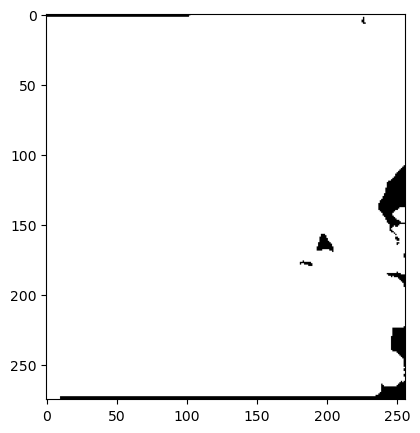

In [130]:
plt.figure(figsize=(5, 5))
plt.imshow(cloud_mask[0], cmap='gray')

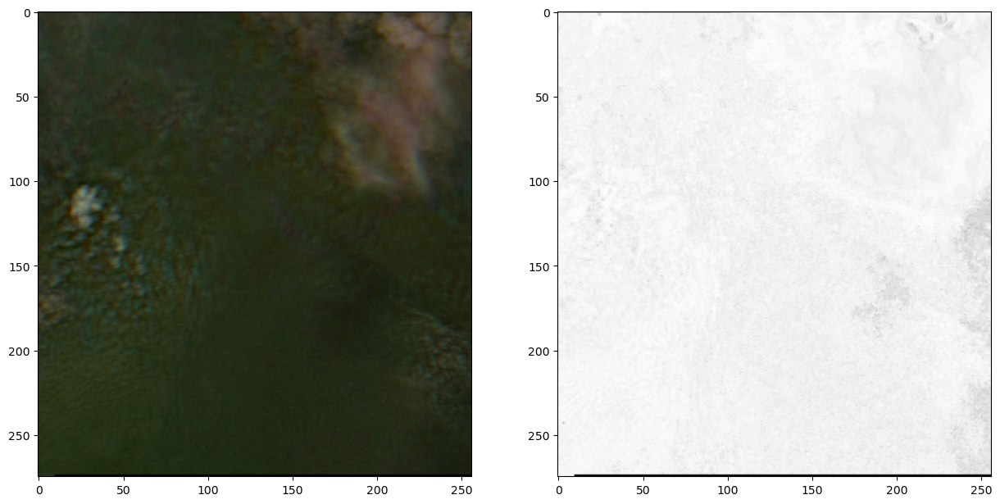

In [131]:
cloud_prob, cloud_mask = imgs.s2cloudless()
true_color_image = (bands[..., [3, 2, 1]] * 3.5).clip(0, 1)
is_cloud = cloud_mask[0]

_, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 15))
ax[0].imshow(true_color_image)
ax[1].imshow(cloud_prob[0], cmap="gray")
plt.show()

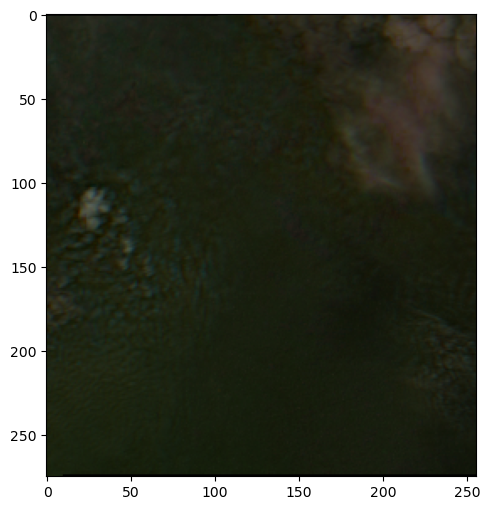

In [136]:
true_color_image = (bands[..., [3, 2, 1]] * 3.5).clip(0, 1)
is_cloud = cloud_mask[0]

_, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 6))
ax.imshow(true_color_image) # tive que diminuir a opacidade da imagem para ela aparecer
ax.imshow(is_cloud, cmap="gray", alpha=0.3 * is_cloud)

In [49]:
data['bands.tif'].shape

(1500, 1000, 13)

## Exemplo da documentação do s2cloudlessdata

In [176]:
# In case you put the credentials into the configuration file you can leave this unchanged
CLIENT_ID = "3aa8ffcb-747a-486e-8f15-516fd2900b5e"
CLIENT_SECRET = "zB6VCmsVGb9NK2NxRZCLqgv57Rjjdmf6GSdvYG5C"

config = SHConfig()

if CLIENT_ID and CLIENT_SECRET:
    config.sh_client_id = CLIENT_ID
    config.sh_client_secret = CLIENT_SECRET
    
config.save("my-profile")

In [177]:
bbox = BBox(((725000, 1595000), (735000, 1610000)), crs=CRS("32615"))

data_collection = DataCollection.SENTINEL2_L1C
evalscript = generate_evalscript(
    data_collection=data_collection,
    meta_bands=["dataMask"],
    merged_bands_output="bands",
    prioritize_dn=False,
)

request = SentinelHubRequest(
    evalscript=evalscript,
    input_data=[SentinelHubRequest.input_data(data_collection=data_collection, time_interval="2017-12-01")],
    responses=[
        SentinelHubRequest.output_response("bands", MimeType.TIFF),
        SentinelHubRequest.output_response("dataMask", MimeType.TIFF),
    ],
    bbox=bbox,
    resolution=(10, 10),
    config=config,
)

data = request.get_data()[0]

bands = data["bands.tif"]
mask = data["dataMask.tif"]

cloud_detector = S2PixelCloudDetector(threshold=0.4, average_over=4, dilation_size=2, all_bands=True)

In [107]:
data["bands.tif"].shape

(1500, 1000, 13)

In [178]:
%%time
# The cloud detector works on stacks of images, but we have a single image.
# By using `bands[np.newaxis, ...]` we go from 3D to 4D

cloud_prob = cloud_detector.get_cloud_probability_maps(bands[np.newaxis, ...])

CPU times: total: 1min 4s
Wall time: 5.89 s


In [179]:
%%time

cloud_mask = cloud_detector.get_cloud_masks(bands[np.newaxis, ...])

CPU times: total: 1min 5s
Wall time: 6.52 s


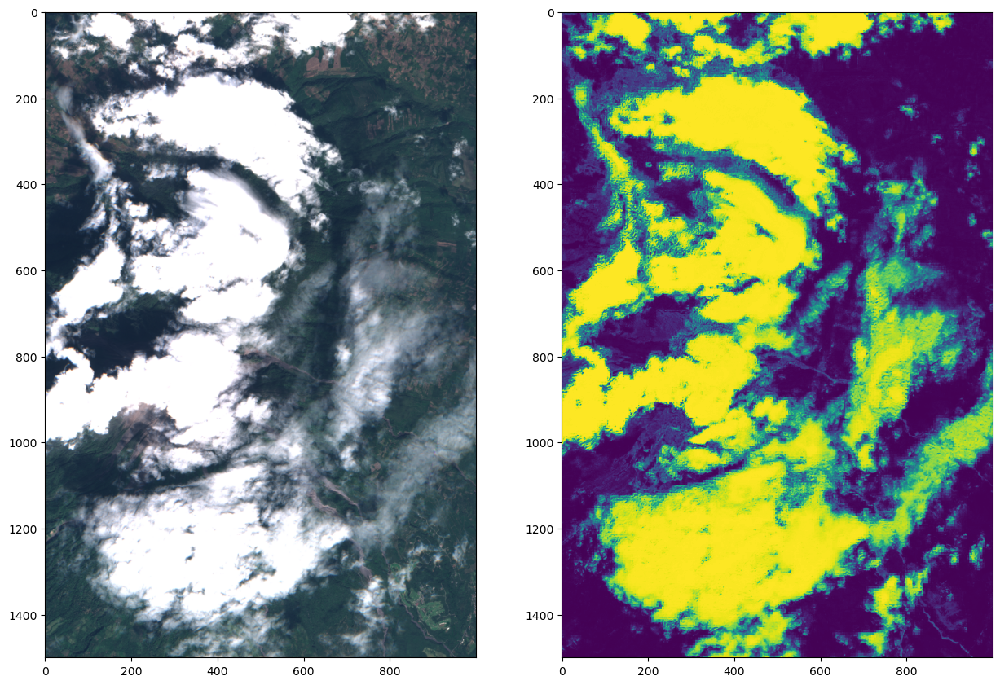

In [185]:
true_color_image = (bands[..., [3, 2, 1]] * 3.5).clip(0, 1)
is_cloud = cloud_mask[0]

_, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 15))
ax[0].imshow(true_color_image)
ax[1].imshow(cloud_prob[0])

In [111]:
true_color_image

array([[[0.1141    , 0.18655   , 0.25445   ],
        [0.1148    , 0.18585001, 0.26005   ],
        [0.1134    , 0.18585001, 0.2597    ],
        ...,
        [0.1687    , 0.27405   , 0.29015002],
        [0.1694    , 0.28875002, 0.29819998],
        [0.18865   , 0.3052    , 0.30275   ]],

       [[0.1134    , 0.18515   , 0.26250002],
        [0.11585   , 0.18830001, 0.2576    ],
        [0.119     , 0.18935   , 0.25725   ],
        ...,
        [0.17395   , 0.26459998, 0.2884    ],
        [0.1813    , 0.28245002, 0.2919    ],
        [0.18270001, 0.2996    , 0.30275   ]],

       [[0.1134    , 0.18445   , 0.2541    ],
        [0.12005   , 0.18935   , 0.26285   ],
        [0.11970001, 0.18759999, 0.26110002],
        ...,
        [0.17885   , 0.2744    , 0.29365   ],
        [0.1841    , 0.2968    , 0.29995   ],
        [0.1841    , 0.29610002, 0.30765   ]],

       ...,

       [[0.1414    , 0.24675   , 0.27964997],
        [0.1428    , 0.24675   , 0.27964997],
        [0.14455   , 0

In [112]:
is_cloud

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [38]:
timestamps = get_available_timestamps(
    data_collection=data_collection, bbox=bbox, time_interval=(dt.datetime(2017, 12, 1), dt.datetime(2017, 12, 12))
)
timestamps

[datetime.datetime(2017, 12, 1, 16, 38, 51),
 datetime.datetime(2017, 12, 6, 16, 32, 21),
 datetime.datetime(2017, 12, 11, 16, 39, 21)]

In [39]:
bands, masks = download_bands_and_valid_data_mask(bbox=bbox, resolution=(10, 10), timestamps=timestamps)

In [40]:
cloud_detector = S2PixelCloudDetector(threshold=0.4, average_over=1, dilation_size=1, all_bands=True)

probability_maps = cloud_detector.get_cloud_probability_maps(bands)
cloud_mask = cloud_detector.get_mask_from_prob(probability_maps)

In [41]:
true_color_images = np.clip(bands[..., [3, 2, 1]] * 3.5, 0, 1)

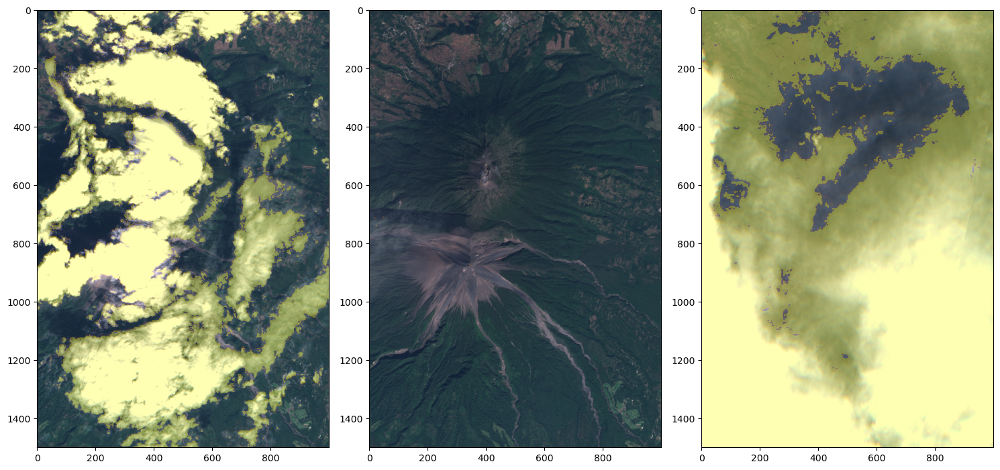

In [42]:
fig = plt.figure(figsize=(15, 10))
n_cols = 3
n_rows = int(np.ceil(len(true_color_images) / n_cols))

for idx, (image, mask) in enumerate(zip(true_color_images, cloud_mask)):
    ax = fig.add_subplot(n_rows, n_cols, idx + 1)
    ax.imshow(image)
    ax.imshow(mask, cmap="gnuplot", alpha=0.3 * (mask > 0))

plt.tight_layout()

## rioxarray

In [14]:
geotiff_file = rioxarray.open_rasterio('MOD17A2H.061_Gpp_500m_doy2021001_aid0001.tif',masked=True)
geotiff_file

<xarray.DataArray (band: 1, y: 410, x: 455)>
[186550 values with dtype=float32]
Coordinates:
  * band         (band) int32 1
  * x            (x) float64 -6.136e+06 -6.135e+06 ... -5.926e+06 -5.926e+06
  * y            (y) float64 -2.365e+05 -2.37e+05 ... -4.256e+05 -4.26e+05
    spatial_ref  int32 0
Attributes:
    add_offset:     0.0
    AREA_OR_POINT:  Area
    scale_factor:   0.0001
    units:          kg C m2

In [23]:
exclude_values = [32761, 32762, 32763, 32764, 32765, 32766]

mask = ~geotiff_file.isin(exclude_values)

geotiff_file.where(mask)

<xarray.DataArray (band: 1, y: 410, x: 455)>
array([[[ nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan, 652., 651.,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
...
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan, 521., 643.,
         643., 506., 383., 554., 515.,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,  nan,
          nan,  nan,  nan,  nan,  nan]]], dtype=float32)
Coordinates:
  * band         (band) int32 1
  * x            (x) float64 -6.136e+06 -6.135e+06 ... -5.926e+06 -5.926e+06
  * y            (y) float64 -2.365e+05 -2.37e+05 ... -4.256e+05 -4.26e+05
    spatial_ref  int32 0
Attributes:
    add_offset:     0.0
    AREA_OR_POINT:  Area
    scale_factor:   0.0001
    units:          kg C m2

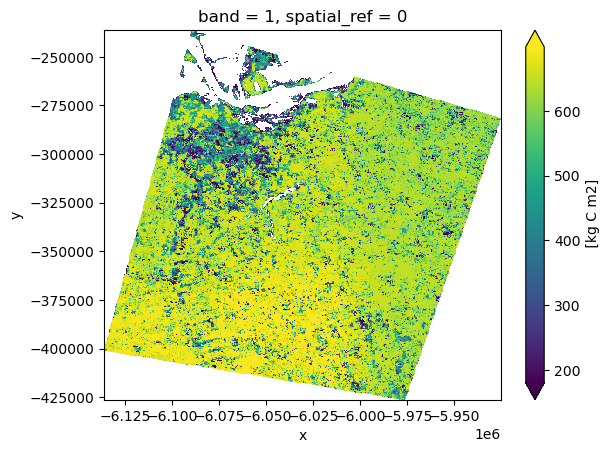

In [30]:
geotiff_file.where(mask).plot(robust=True)